# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [106]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5. 

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


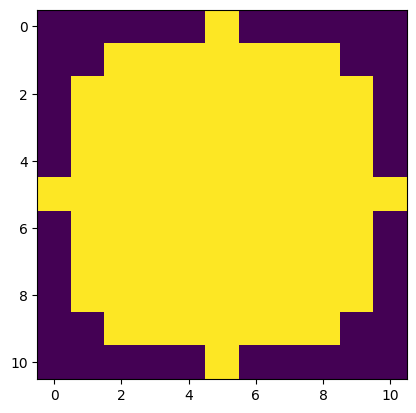

In [107]:
if student :
  strell = morpho.disk(5)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]
 [1. 1.]]


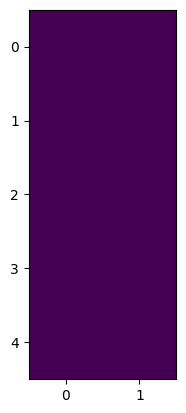

In [108]:
def line_strell(width,length):
  if student :
    strell = np.ones((length,width))
  return strell

strell = line_strell(2,5)
print(strell)
plt.imshow(strell)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

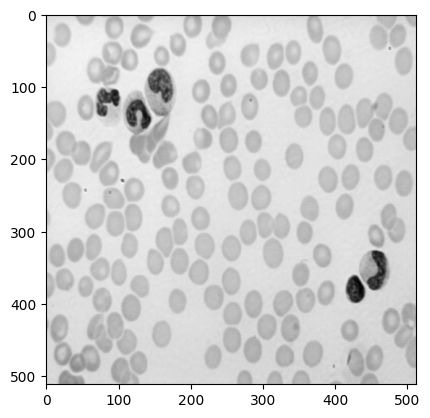

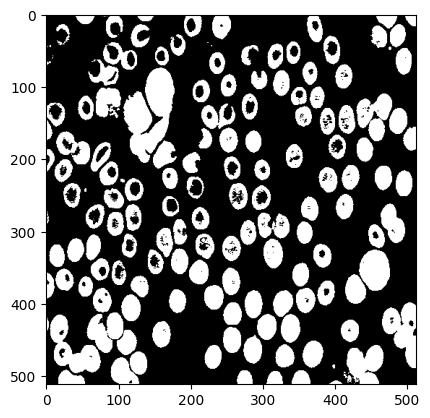

In [109]:
#load the cell image in grayscale and display it 
if student:
  img = skio.imread("images/cell.tif")
  plt.imshow(img, cmap='gray')
  plt.show()
  # Theresholding and display
  t = 150
  binary_img = ( img < t )
  plt.imshow(binary_img, cmap='gray')
  plt.show()

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

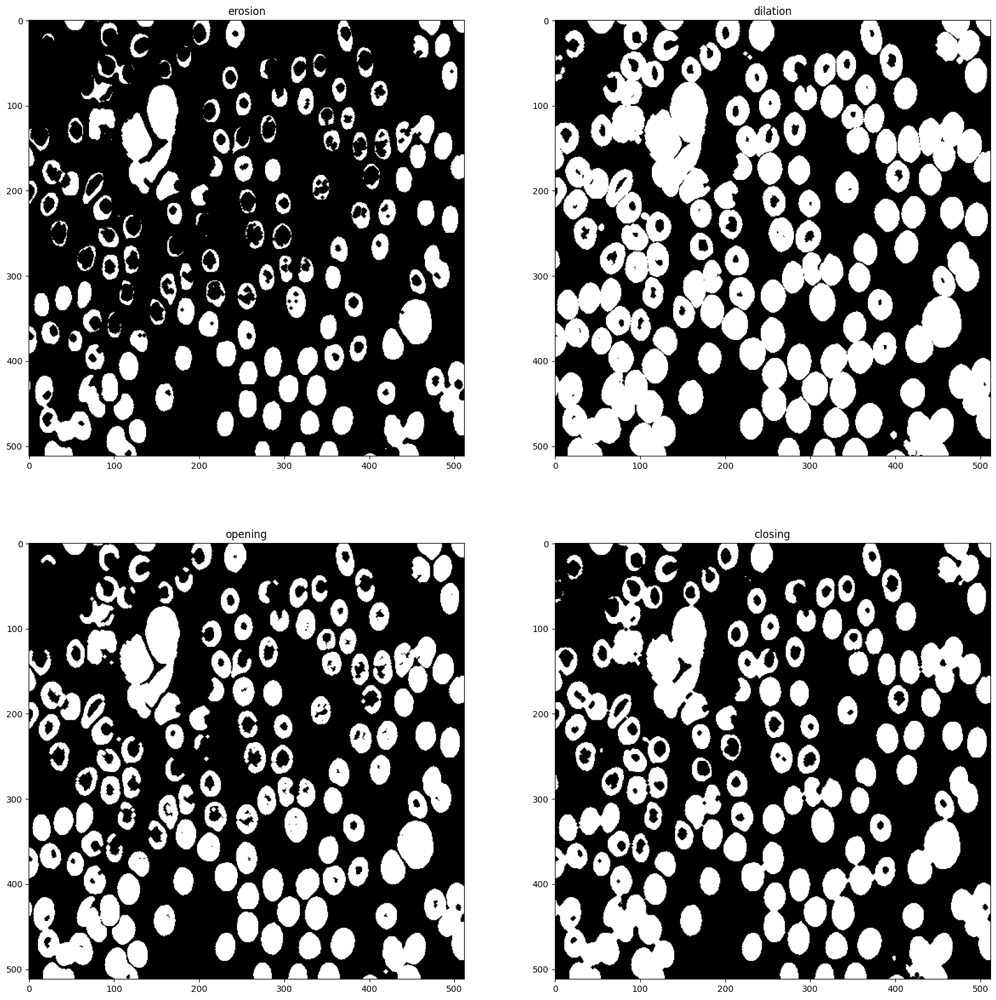

In [110]:
strell = morpho.disk(2)
fig,ax = plt.subplots(2, 2, figsize=(20,20))
imgs = [morpho.binary_erosion(binary_img,strell),morpho.binary_dilation(binary_img,strell),morpho.binary_opening(binary_img,strell),morpho.binary_closing(binary_img,strell)]# Add in this list the 4 images, obtained with the for operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()

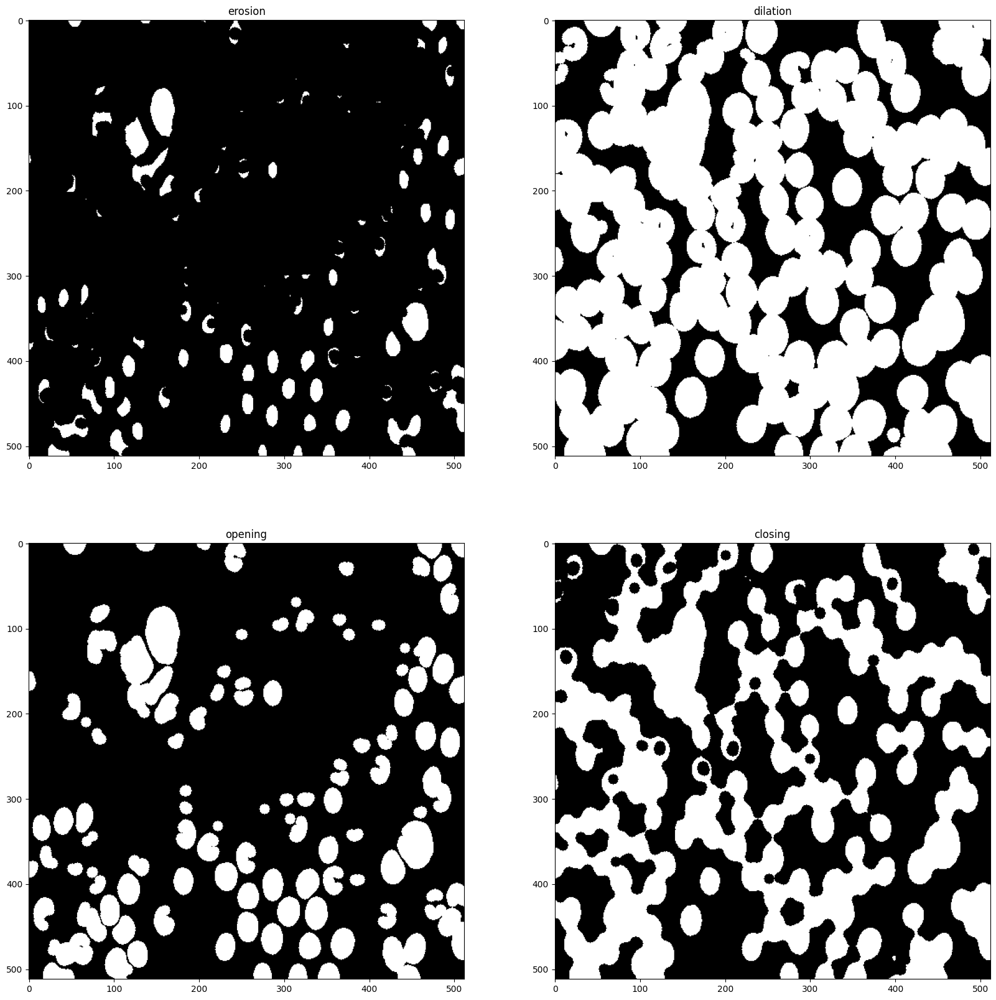

In [111]:
# try your own structuring elements and make the size vary
if student :
  strell = morpho.disk(6)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.binary_erosion(binary_img,strell),morpho.binary_dilation(binary_img,strell),morpho.binary_opening(binary_img,strell),morpho.binary_closing(binary_img,strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

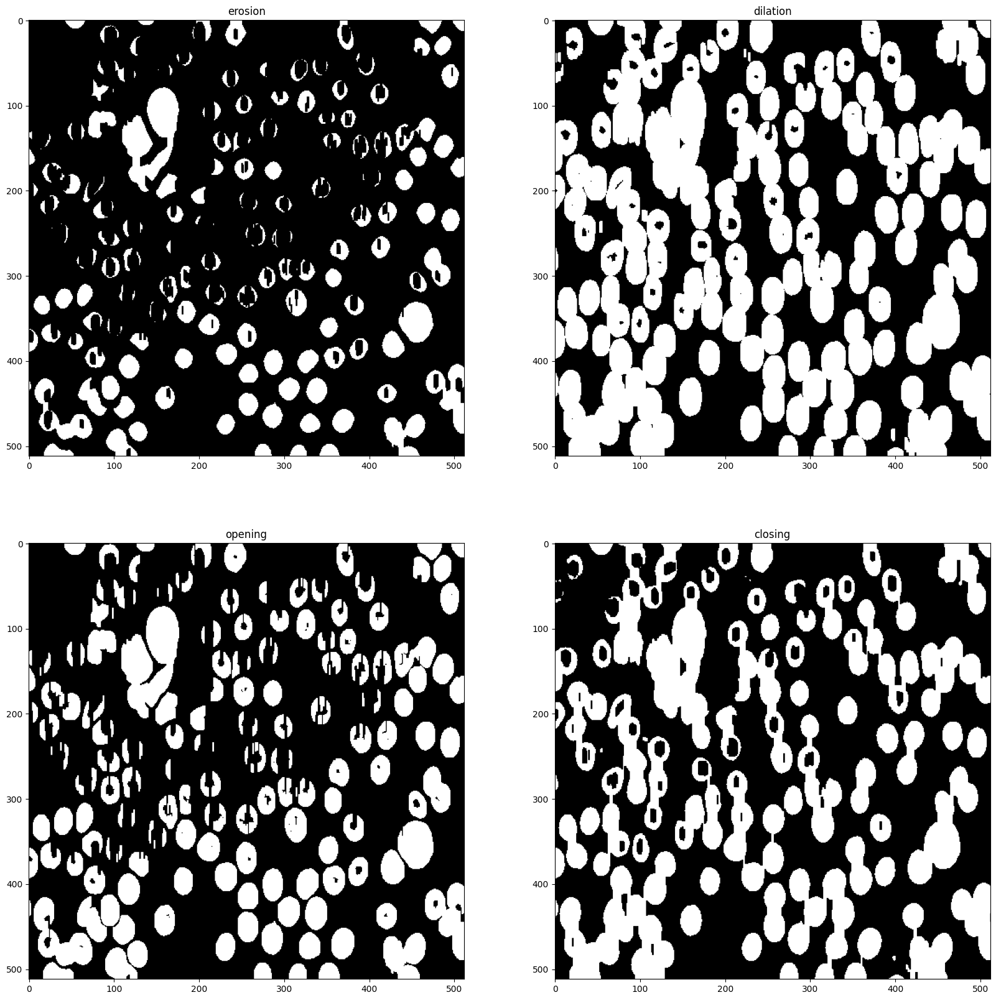

In [112]:
# try your own structuring elements and make the size vary
if student :
  strell = line_strell(2,10)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.binary_erosion(binary_img,strell),morpho.binary_dilation(binary_img,strell),morpho.binary_opening(binary_img,strell),morpho.binary_closing(binary_img,strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

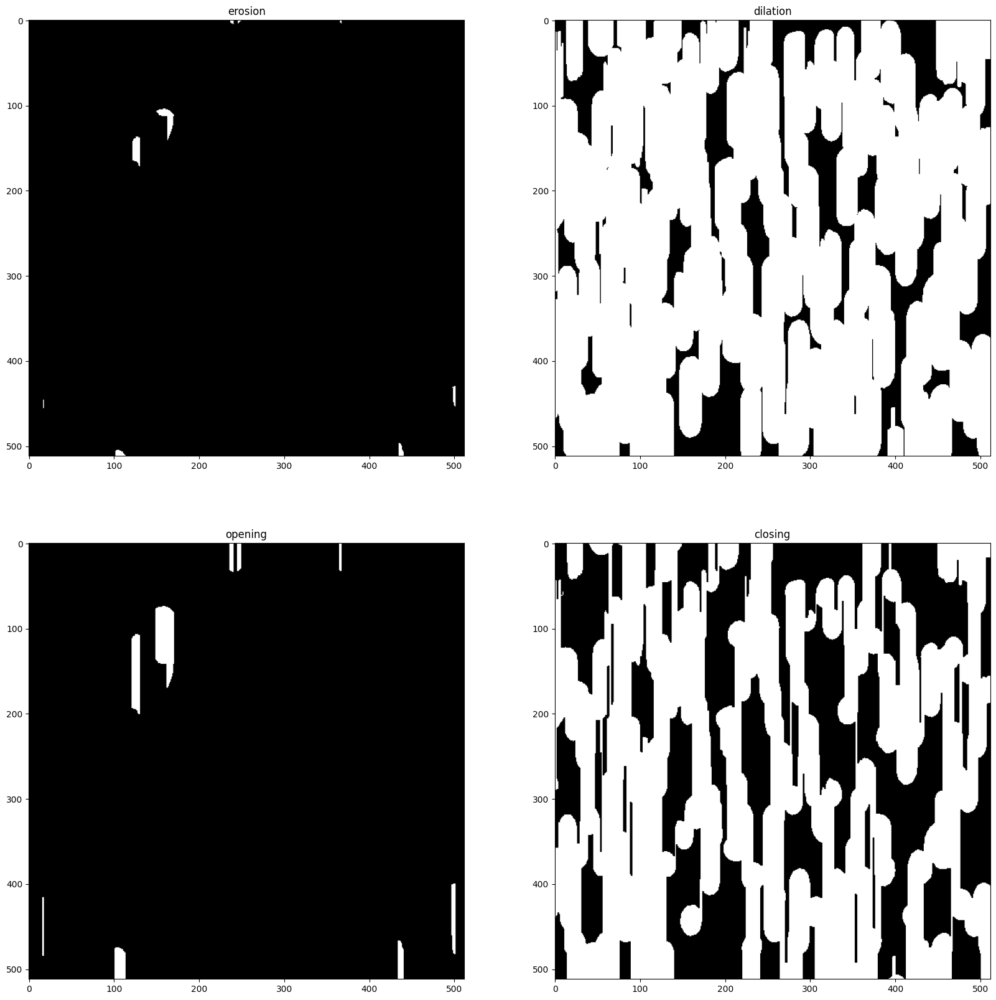

In [113]:
# try your own structuring elements and make the size vary
if student :
  strell = line_strell(2,60)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.binary_erosion(binary_img,strell),morpho.binary_dilation(binary_img,strell),morpho.binary_opening(binary_img,strell),morpho.binary_closing(binary_img,strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : The object of interest are in white so the shape of the structuring element determines the shape we are looking for in the image. For example, with a disk, we get shapes that look more like a disk by applying dilatation, and by applying a closing the cell were merging in all directions, whereas with a vertical line, the dilatation shapes the cell in rectangular shapes and the closing makes the cells merge in the vertical direction. For erosion and opening, it's the black parts that take the shape of the structuring element.
- **Q** : What is the influence of the size of the structuring element ?
- **A** : In erosion for example the size of the structuring element matters a lot because we try to fit in this structuring element inside the white parts of the image to decides whether or not to keep the pixel 1. So if the structuring element is bigger than a cell the whole cell will get deleted but if it's smaller and can fit inside, the cell will only get eroded. In dilatation, the bigger the structuring element, the more intersections with white pixels we get, and the larger the white parts of the image will be. By combining these two in this order, we can understand how size influences opening. And lastly in closing, the size of the structuring element decides the degree of merging : objects whose distance is comparable to the size of the structuring element are merged.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


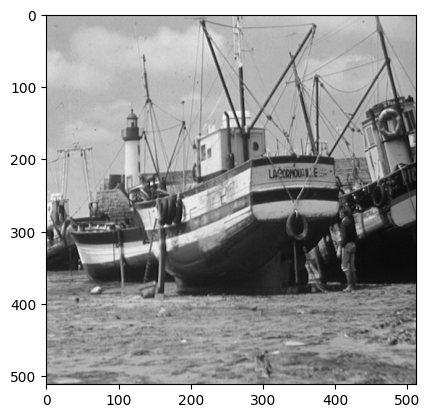

In [114]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

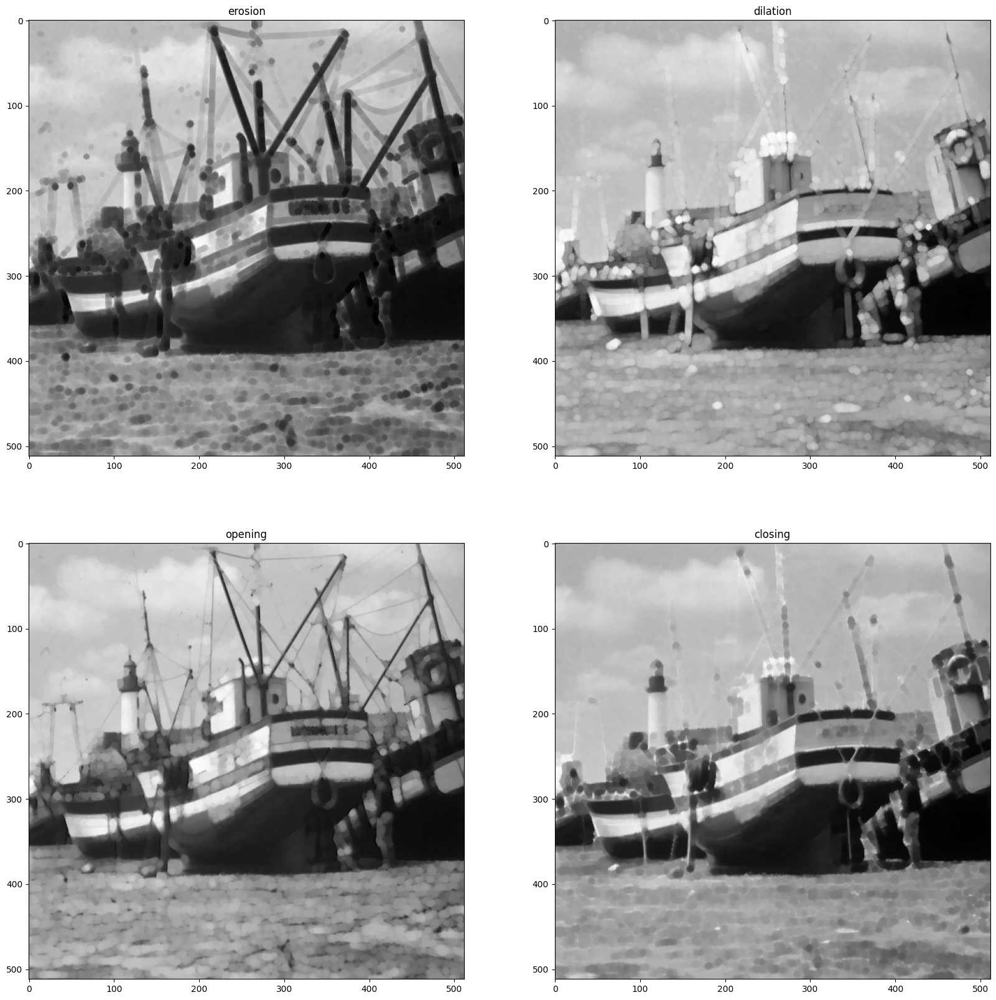

In [115]:
if student:
  ### start code
  strell = morpho.disk(3)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.erosion(img,strell),morpho.dilation(img,strell),morpho.opening(img,strell),morpho.closing(img,strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()
  ### end code

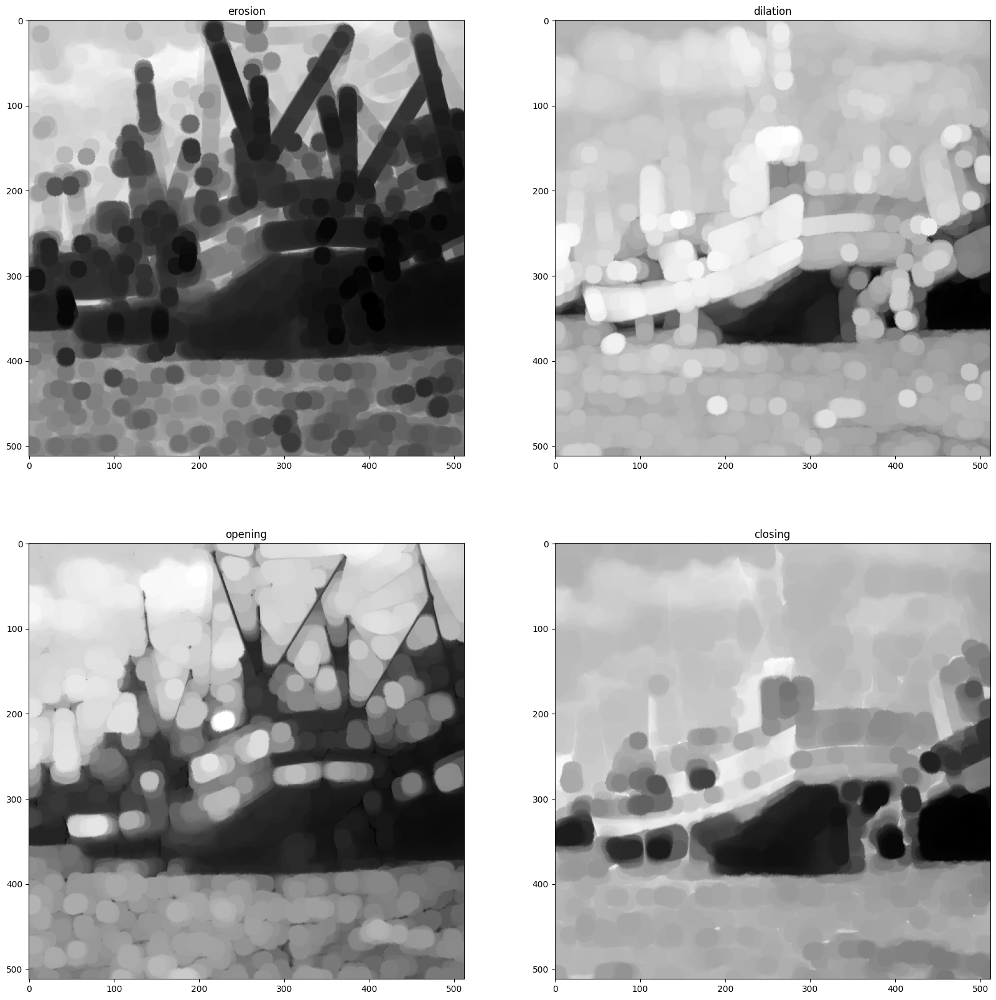

In [116]:
if student:
  ### start code
  strell = morpho.disk(10)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.erosion(img,strell),morpho.dilation(img,strell),morpho.opening(img,strell),morpho.closing(img,strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()
  ### end code

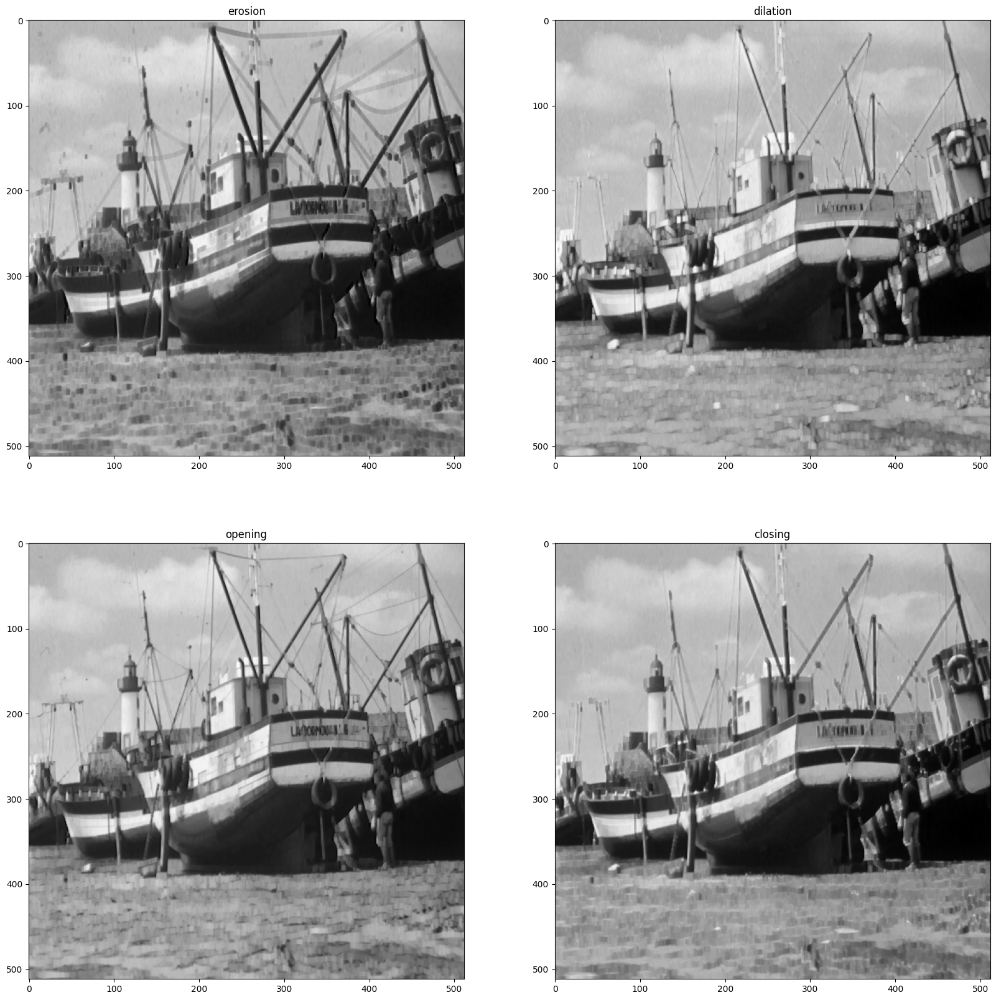

In [117]:
if student:
  ### start code
  strell = line_strell(2,5)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.erosion(img,strell),morpho.dilation(img,strell),morpho.opening(img,strell),morpho.closing(img,strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()
  ### end code

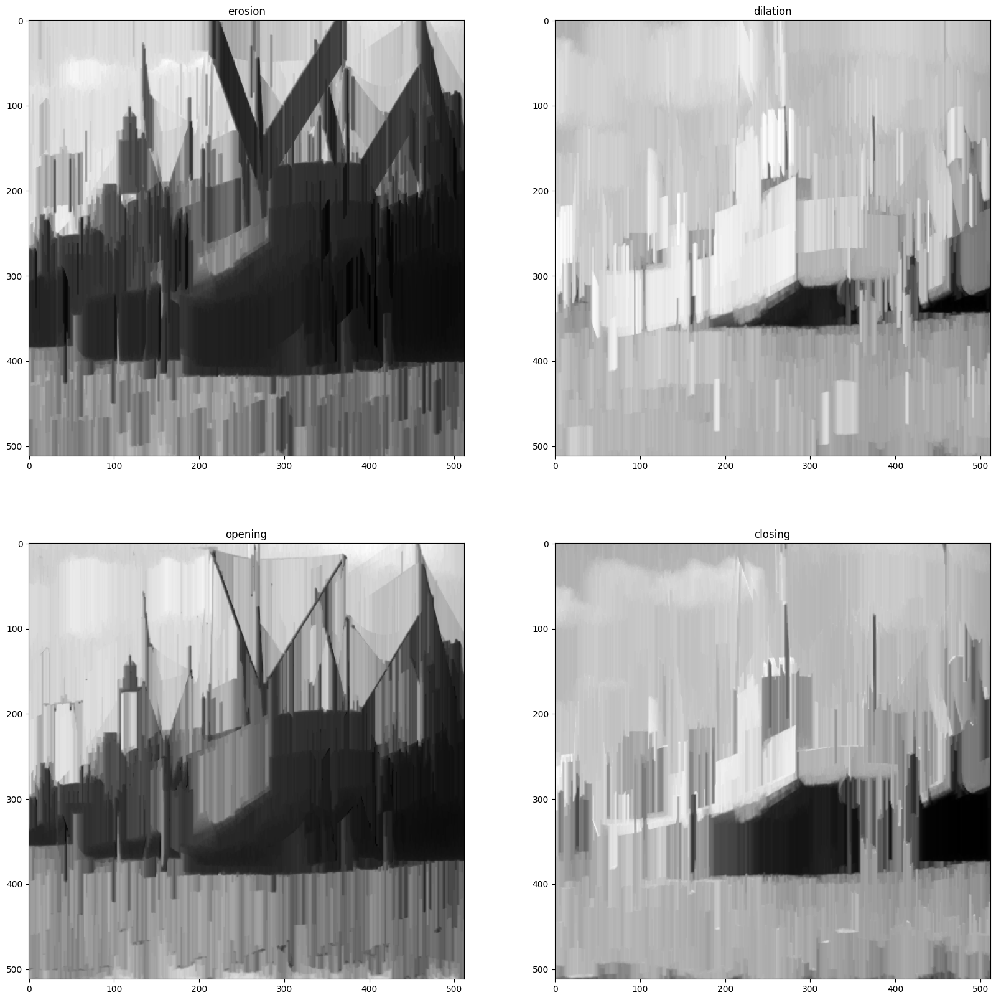

In [118]:
if student:
  ### start code
  strell = line_strell(2,60)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.erosion(img,strell),morpho.dilation(img,strell),morpho.opening(img,strell),morpho.closing(img,strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()
  ### end code

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : For the erosion operation, the dark regions are enlarged according to the structuring element's shape and size and small light regions are deleted, whereas for dilatation the opposite happens with light regions. For the opening and closing operations the size of the objects is more or less preserved, but quick variations are deleted. Tthe shape of the structuring element determines the direction in which those variations are deleted, when using a circle, the deletion is isotropic, when using a vertical segment, variations are deleted in the vertical direction. Moreover, the greater the size of the structuring element, the blurrier the image becomes.

- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.
- **A** : We know that : $$D\left[ D(X, B), B'\right] = D\left( X, B \oplus B'\right)$$
So a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3 should be equivalent to a direct dilatation by a structuring element that is the dilation of one of the original structuring elements by the other, which is different from dilation by a disk structuring element of size 5.

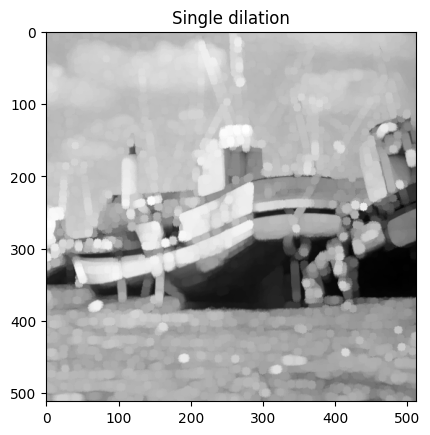

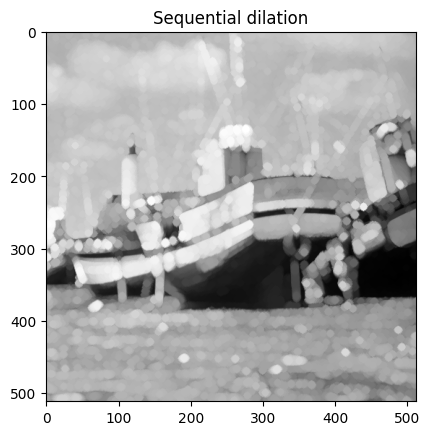

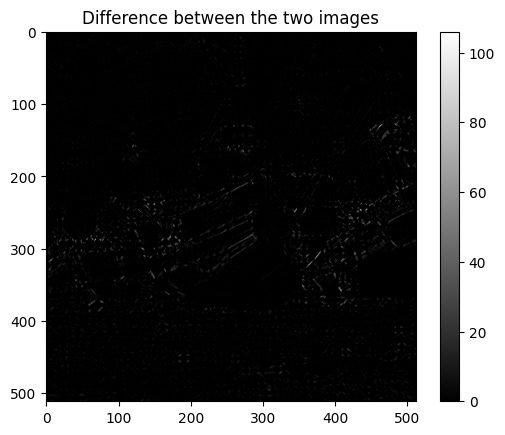

195761


In [119]:
if student:
  ### start code
  dilation = morpho.dilation(img,morpho.disk(5))
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))


- **Q:** Plot the result of an opening by a disk structuring element of size 2 followed by
an opening by a disk structuring element of size 3? 
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.
- **A:** We can see below that sequential dilation by a disk of size 2 then a disk of size 3 is equivalent to dilation by a structuring element obtained by dilating a disk of size 2 by a disk of size 3.

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


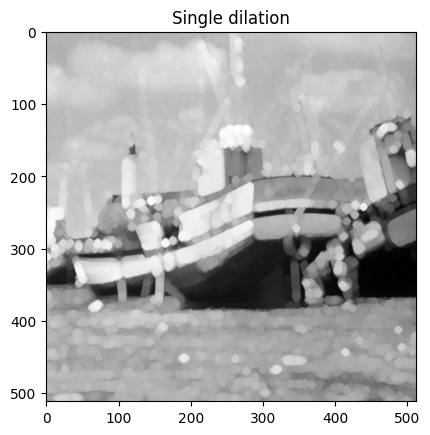

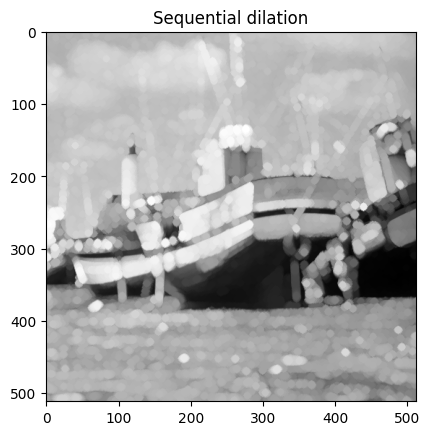

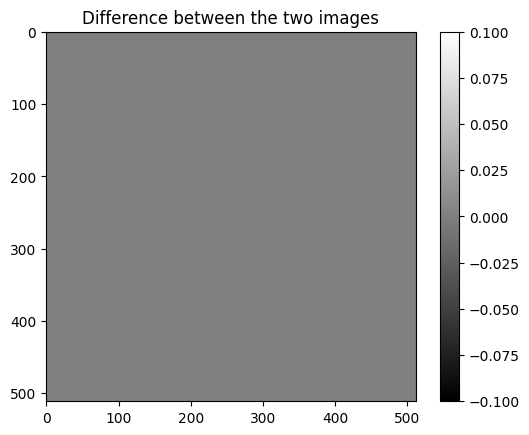

0


In [120]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
  sqr_strell = morpho.disk(2)
  sqr_strell = np.pad(sqr_strell,3)
  sqr_strell = morpho.dilation(sqr_strell,morpho.disk(3))
  print(sqr_strell)

  # Use it to perform the image dilation
  dilation = morpho.dilation(img,sqr_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()
  
  # Compare it with the sequential dilation
  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()
    
  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.
- **A:** Idempotence if formally defined as:
$$\left( X^B \right)^B = X^B$$
So if we apply the closing operation once, apply it again and again do not change the results, as illustrated bellow:


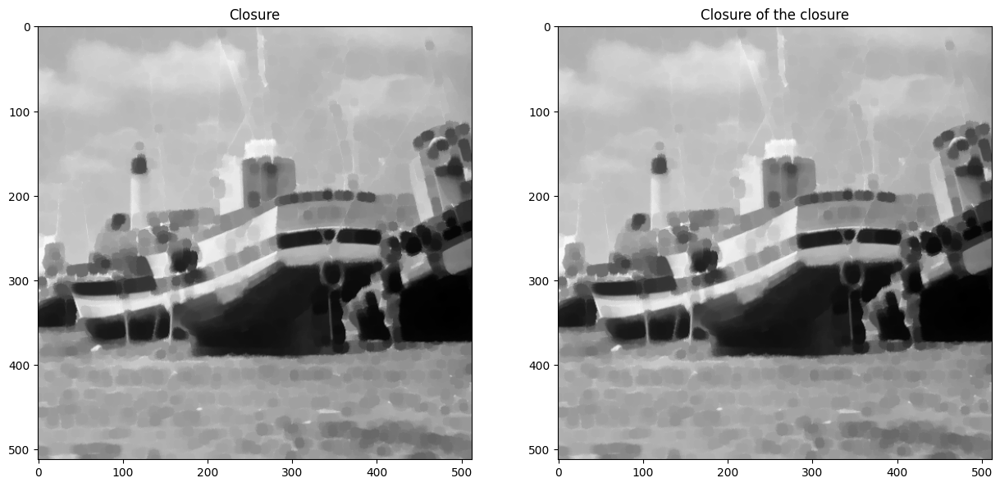

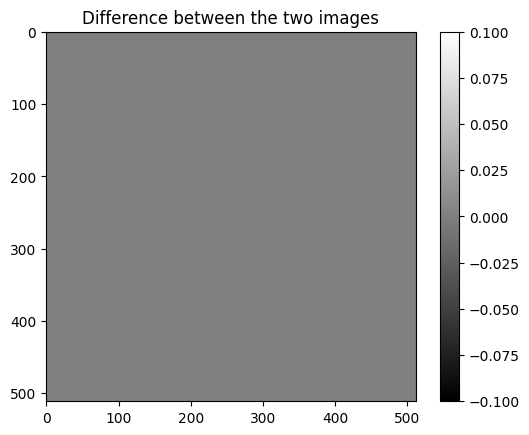

0


In [121]:
if student :
  ### start code
  strell = morpho.disk(5)

  fig,ax = plt.subplots(1,2, figsize=(15,8))
  ax = ax.reshape(-1)

  # closing operation
  imgB = morpho.closing(img, strell)

  # two successive closing operations
  imgBB = morpho.closing(imgB, strell)

  imgs = [imgB, imgBB] 

  names = ["Closure","Closure of the closure"]

  for i in range(2):
      ax[i].set_title(names[i])
      ax[i].imshow(imgs[i],cmap = "gray")
  plt.show()

  plt.imshow(imgB-imgBB,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(imgB-imgBB)))
  ### end code

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : The top-hat transformation is used to identify objects that are smaller than a given structuring element and are brighter than their surrounding background. For instance, when employing a disk structuring element, this technique can detect small, bright elements regardless of their orientation. However, when using vertical segments as the structuring element, it primarily identifies bright horizontal artifacts, while employing horizontal segments as the structuring element highlights bright vertical structures.

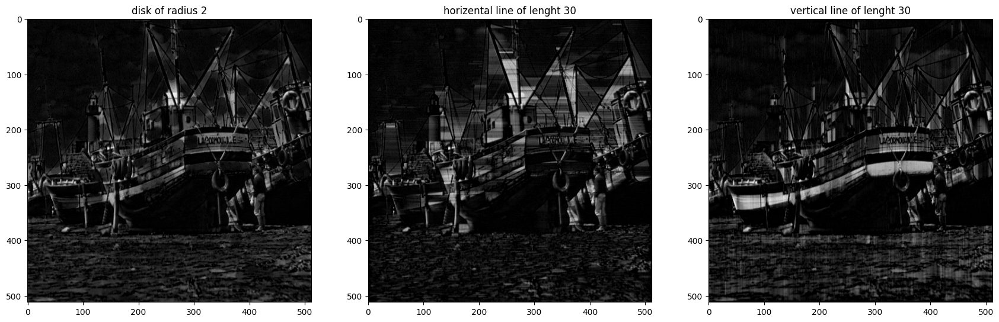

In [123]:
if student:
  ### start code
  strell0 = morpho.disk(8)
  strell1 = line_strell(30,1)
  strell2 = line_strell(1,30)
  top_hat0 = img - morpho.opening(img, strell0)
  top_hat1 = img - morpho.opening(img, strell1)
  top_hat2 = img - morpho.opening(img, strell2)

fig, ax = plt.subplots( 1, 3, figsize = (21,7))
ax[0].imshow(top_hat0,cmap = "gray")
ax[0].set_title('disk of radius 2')
ax[1].imshow(top_hat1,cmap = "gray")
ax[1].set_title('horizental line of lenght 30')
ax[2].imshow(top_hat2,cmap = "gray")
ax[2].set_title('vertical line of lenght 30')
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : The dual top-hat transformation follows a similar analysis as the top-hat transformation, but it focuses on identifying dark regions instead of bright ones.

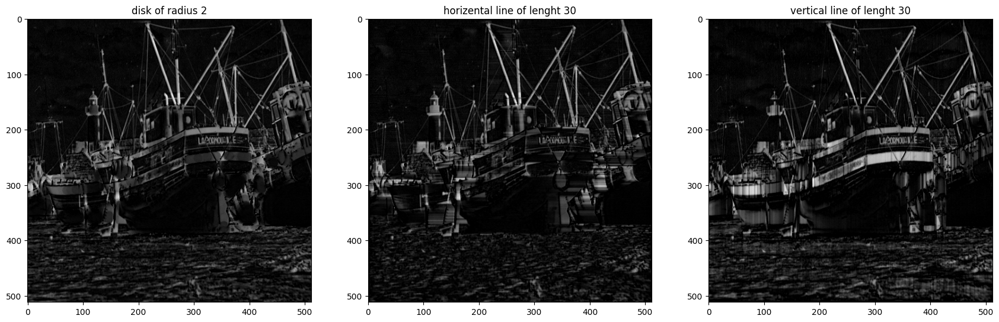

In [124]:
if student:
  ### start code
  strell0 = morpho.disk(8)
  strell1 = line_strell(30,1)
  strell2 = line_strell(1,30)
  dual_top_hat0 = morpho.closing(img, strell0) - img
  dual_top_hat1 = morpho.closing(img, strell1) - img
  dual_top_hat2 = morpho.closing(img, strell2) - img 

fig, ax = plt.subplots( 1, 3, figsize = (21,7))
ax[0].imshow(dual_top_hat0,cmap = "gray")
ax[0].set_title('disk of radius 2')
ax[1].imshow(dual_top_hat1,cmap = "gray")
ax[1].set_title('horizental line of lenght 30')
ax[2].imshow(dual_top_hat2,cmap = "gray")
ax[2].set_title('vertical line of lenght 30')
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?
- **A**:The filtering operation that can be expected from alternate sequential filters is noise cancellation and smoothing.

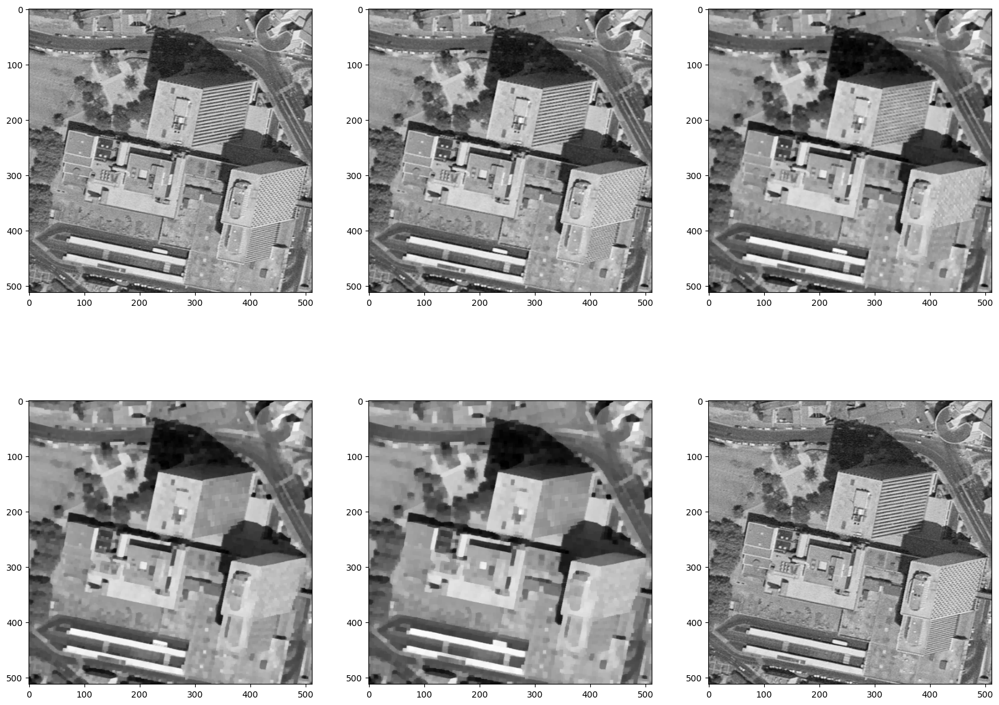

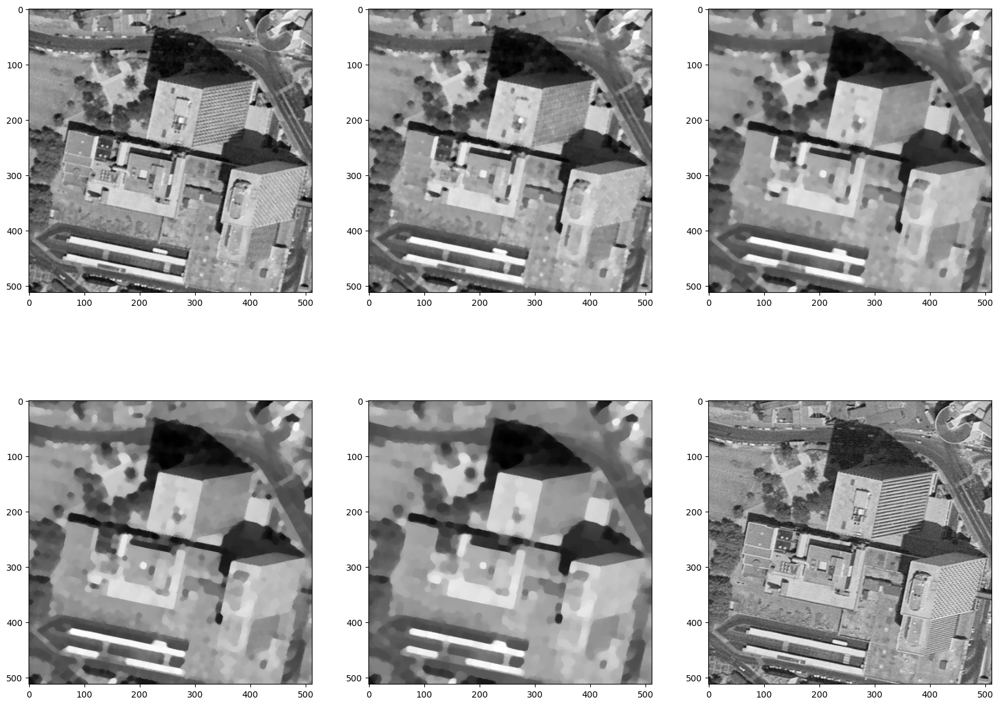

In [125]:
# Example
img = skio.imread("images/montreuil.tif")

# Structuring elements
se1=morpho.square(1)
se2=morpho.square(2)
se3=morpho.square(3)
se4=morpho.square(4)
se5=morpho.square(5)

# Images
fas1=morpho.closing(morpho.opening(img,se1),se1)
fas2=morpho.closing(morpho.opening(fas1,se2),se2)
fas3=morpho.closing(morpho.opening(fas2,se3),se3)
fas4=morpho.closing(morpho.opening(fas3,se4),se4)
fas5=morpho.closing(morpho.opening(fas4,se5),se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")
plt.show()

#Try you own
if student :
    se1=morpho.disk(1)
    se2=morpho.disk(2)
    se3=morpho.disk(3)
    se4=morpho.disk(4)
    se5=morpho.disk(5)

# Images
    fas1=morpho.closing(morpho.opening(img,se1),se1)
    fas2=morpho.closing(morpho.opening(fas1,se2),se2)
    fas3=morpho.closing(morpho.opening(fas2,se3),se3)
    fas4=morpho.closing(morpho.opening(fas3,se4),se4)
    fas5=morpho.closing(morpho.opening(fas4,se5),se5)

    fig,ax = plt.subplots(2,3,figsize = (20,15))
    ax[0,0].imshow(fas1,cmap = "gray")
    ax[0,1].imshow(fas2,cmap = "gray")
    ax[0,2].imshow(fas3,cmap = "gray")
    ax[1,0].imshow(fas4,cmap = "gray")
    ax[1,1].imshow(fas5,cmap = "gray")
    ax[1,2].imshow(img,cmap = "gray")
    plt.show()
  
   

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: (code in the following cell) When we apply the morphological gradient to an image, the outcomes closely resemble what we would achieve when calculating the image's gradient. Dilation enhances bright regions while diminishing dark areas, while erosion amplifies dark regions and reduces bright ones. Consequently, when we calculate the difference between these two operations, we obtain the contours of objects within the image. The thickness of these contours depends on the size of the structuring element: a larger element yields thicker contours. Additionally, enlarging the structuring element size results in reduced noise but so blurry.

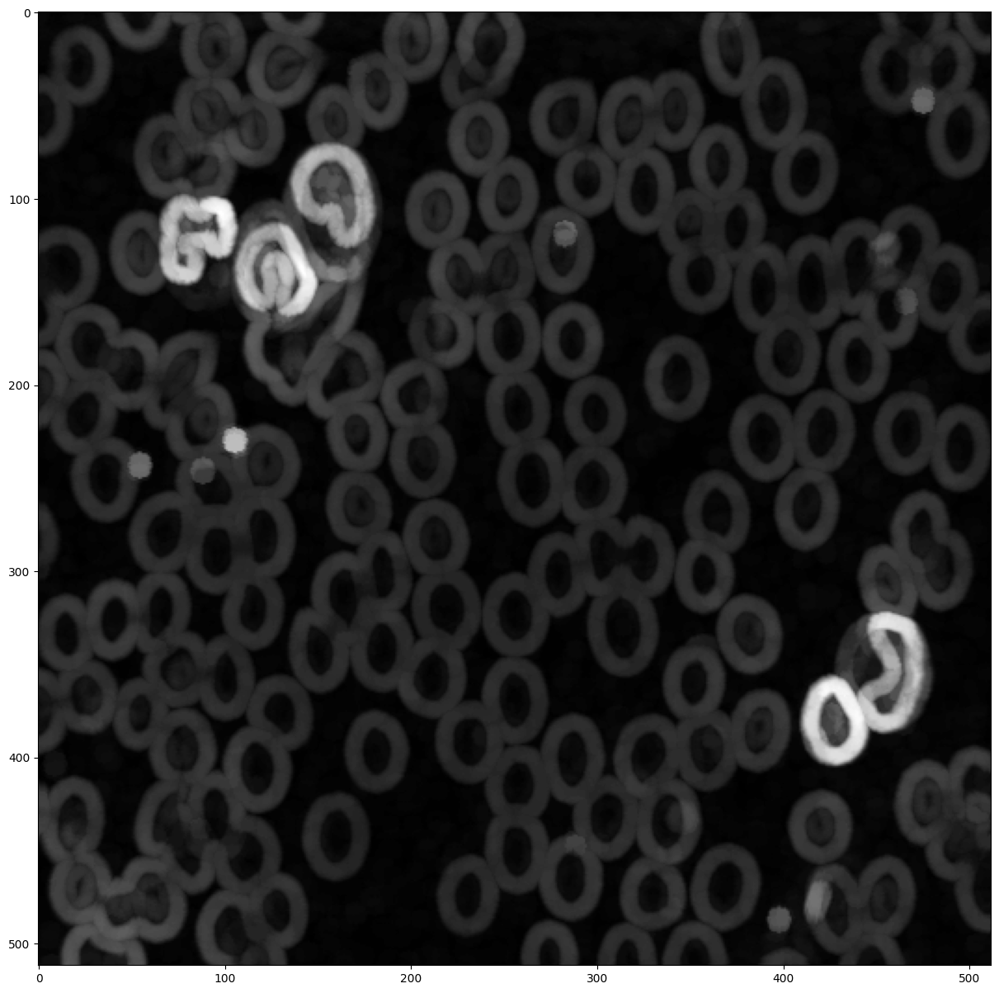

In [130]:
if student : 
  img = skio.imread("images/cell.tif")
  B = morpho.disk(5)
  morpho_grad = morpho.dilation(img,B)-morpho.erosion(img,B)
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : (code in the next cell) Determining the correct threshold value can be challenging because when we raise it, we can suppress unwanted noise structures, but at the same time, we risk losing genuine contours that separate areas with similar gray levels. Thus, it's essential to strike a balance between these two factors.

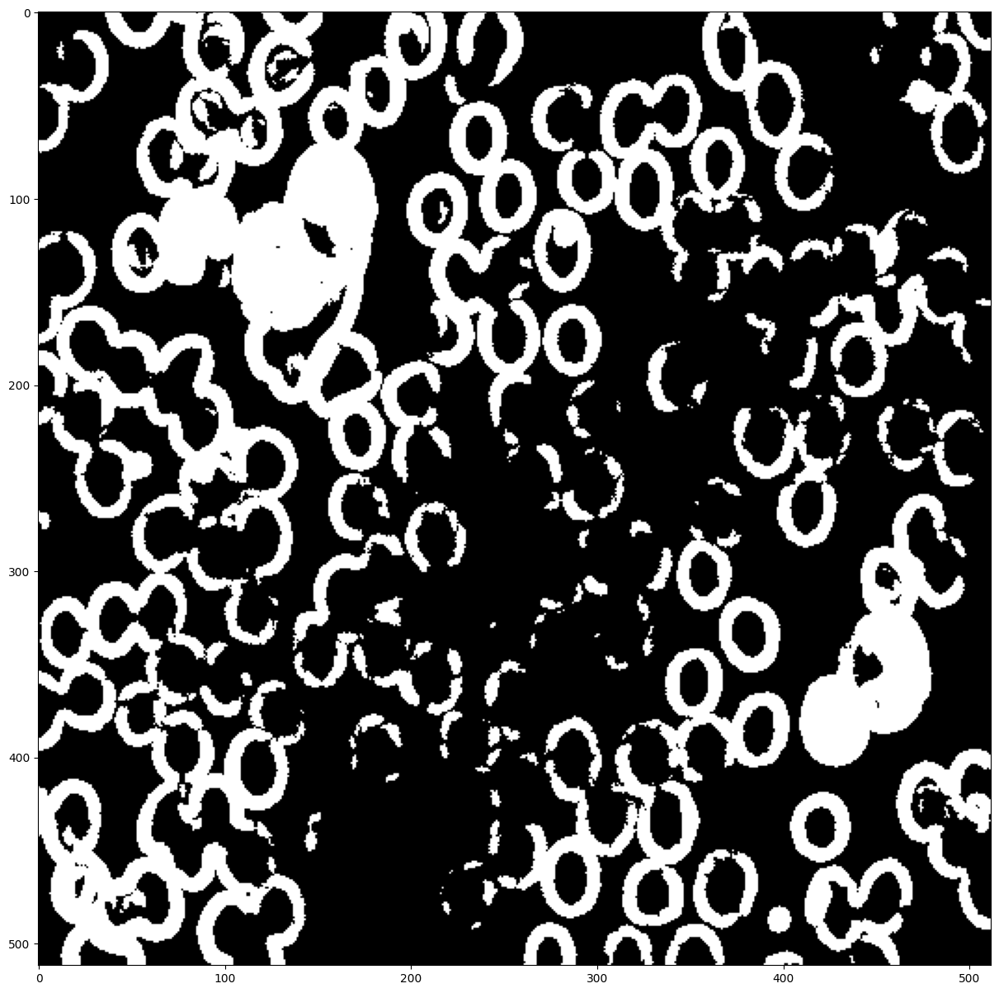

In [131]:
if student :
  thresh_grad = morpho_grad > 25
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** :(code in the next cell) In the cell below, the regions that have been segmented are overlaid onto the gradient image. The watershed algorithm effectively separates certain cells, but in some cases, it combines multiple cells into a single region.
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :(code in the next cell) k determines the number of detected regions in the segmentation.

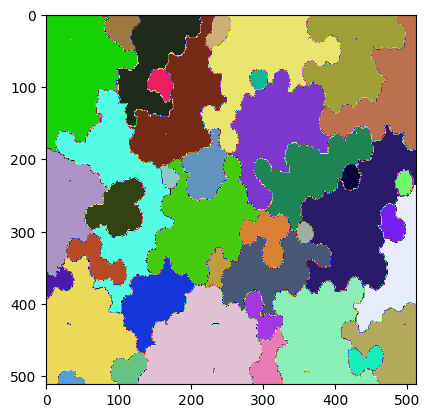

In [133]:
import matplotlib
from skimage.segmentation import watershed
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  wat = watershed(morpho_grad,60)

plt.imshow(wat, cmap =cmaprand)
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : (code in the next cell) By performing a closing operation on the gradient image, we effectively eliminate small dark regions, resulting in smoother and more continuous contours. This process also helps in reducing some microstructures and noise. However, it's worth noting that this improvement in the gradient image didn't translate into an enhanced outcome for the watershed algorithm. This could be attributed to the fact that the internal structures, when smoothed out, caused the interior of the cells to become brighter, which in turn led to less pronounced or distinct contour
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : (code in the next cell) The application of an opening operation leads to the removal of small, bright regions. Consequently, this causes a degradation in the quality of cell contours, and unfortunately, the outcome of the watershed algorithm is adversely affected.

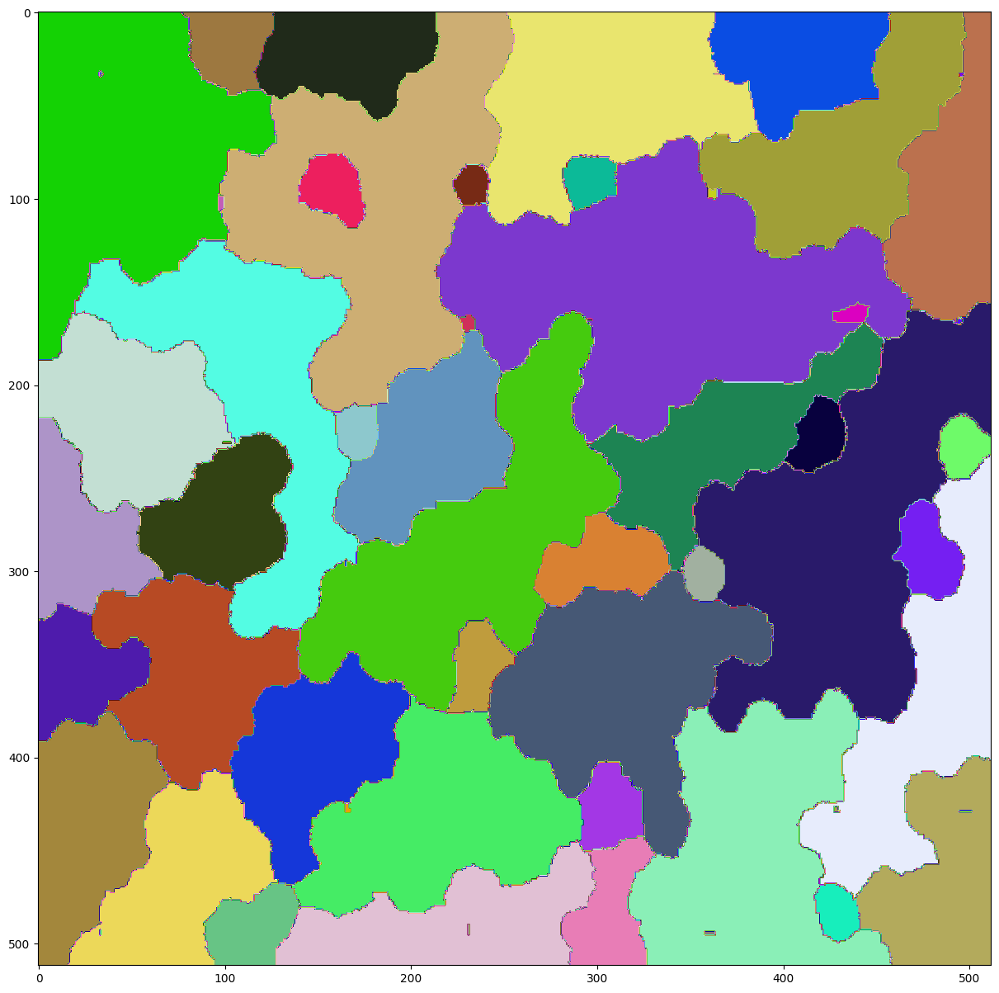

In [136]:
if student :
  wat_closing = watershed(morpho.closing(morpho_grad,morpho.disk(5)),60)
plt.figure(figsize =(15,15))
plt.imshow(wat_closing,cmap =cmaprand)
plt.show()

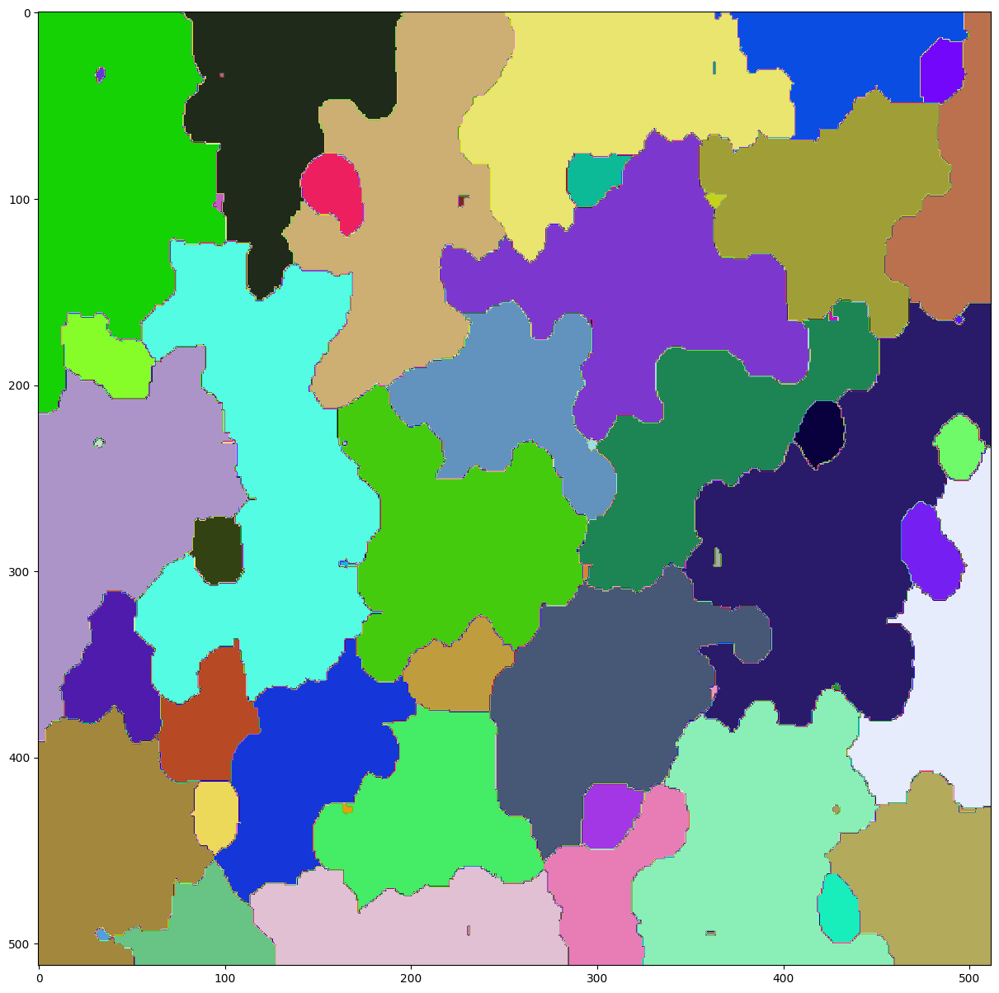

In [137]:
if student :
  wat_opening = watershed(morpho.opening(morpho_grad,morpho.disk(5)),60)
plt.figure(figsize =(15,15))
plt.imshow(wat_opening,cmap =cmaprand)
plt.show()

Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : When we calculate the reconstruction from the opening of the gradient, we notice that the resulting image contains more information, including additional details and noise and also less blur when compared to the original morphological gradient image. Consequently, this process doesn't contribute to an enhancement in the segmentation of the cells.

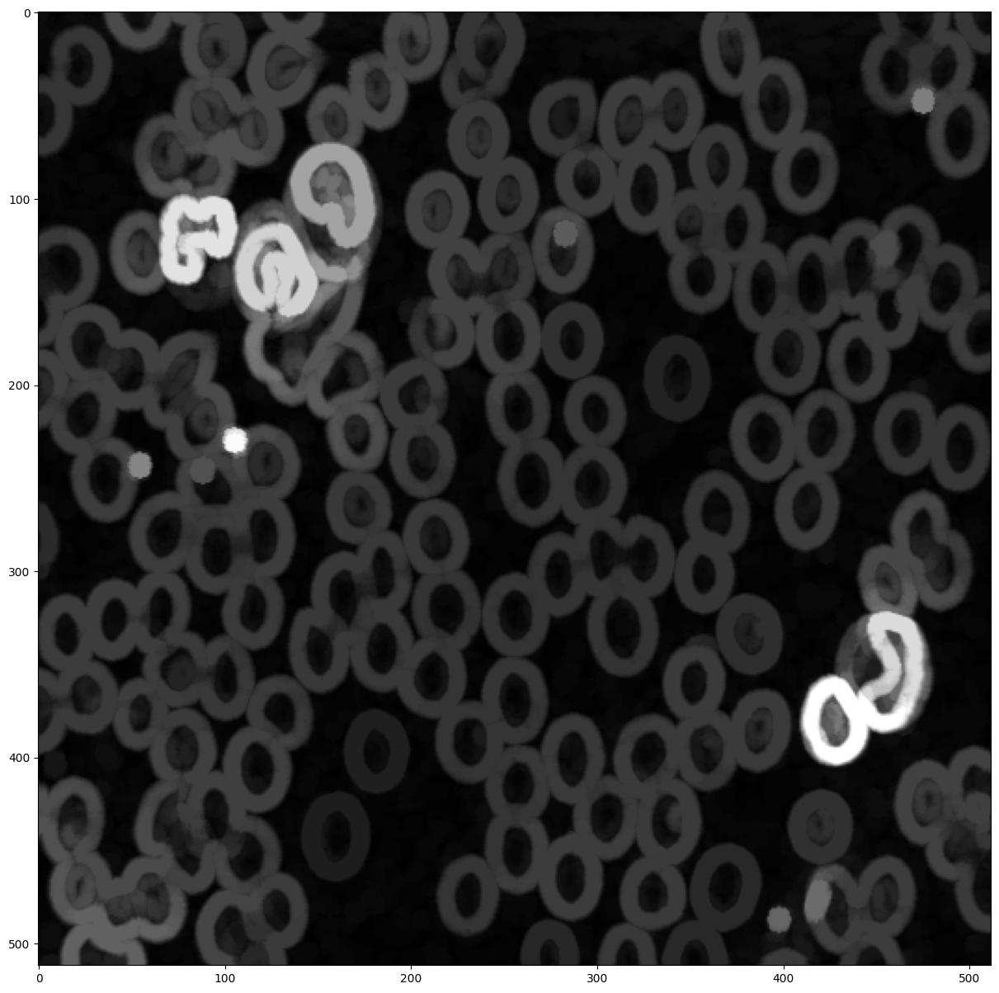

In [95]:
imOpen = morpho.opening( morpho_grad, morpho.disk(5) )
reco= morpho.reconstruction( imOpen, morpho_grad )
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring alement a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : When we compute the reconstruction from the closing of the gradient, the resulting image mainly preserves the contours and deletes any additional noise. This suggests that it should be beneficial in achieving an efficient segmentation of the cells.

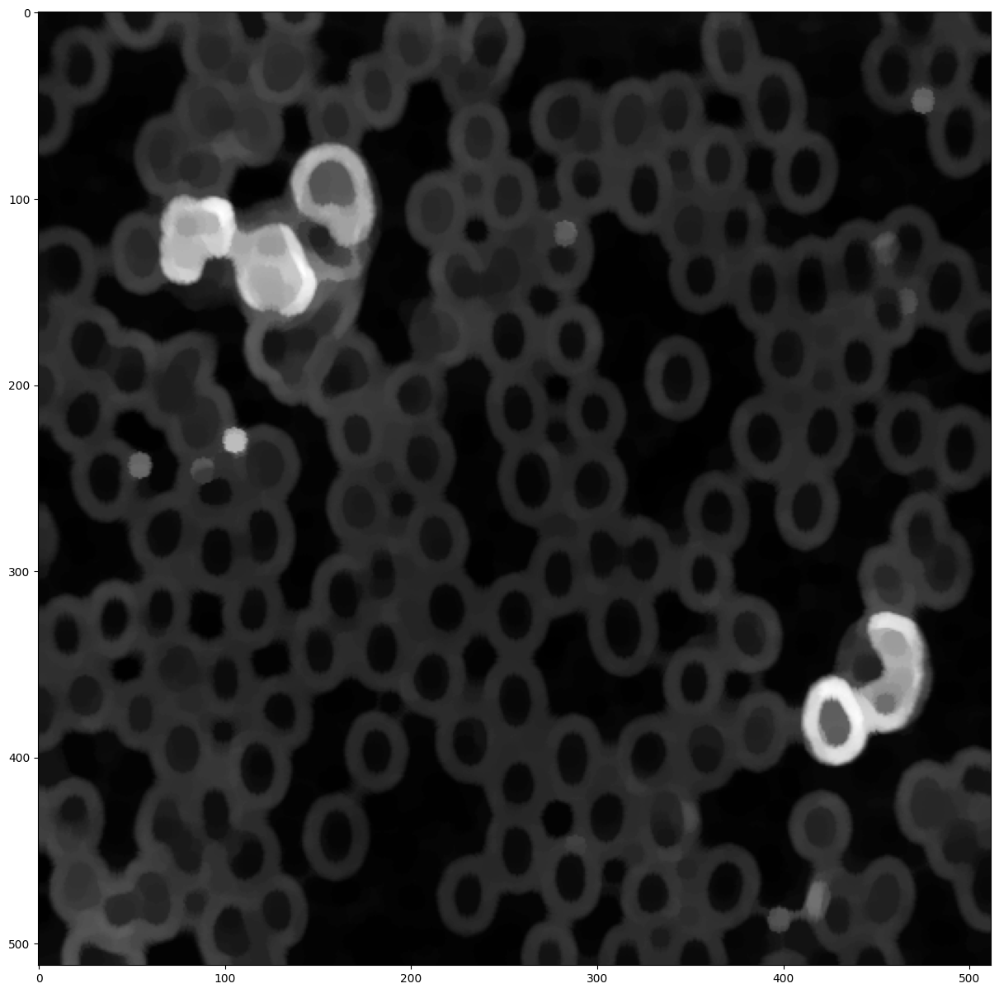

In [96]:
imClos = morpho.closing( morpho_grad, morpho.disk(5) )
reco = morpho.reconstruction( morpho_grad, imClos)
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

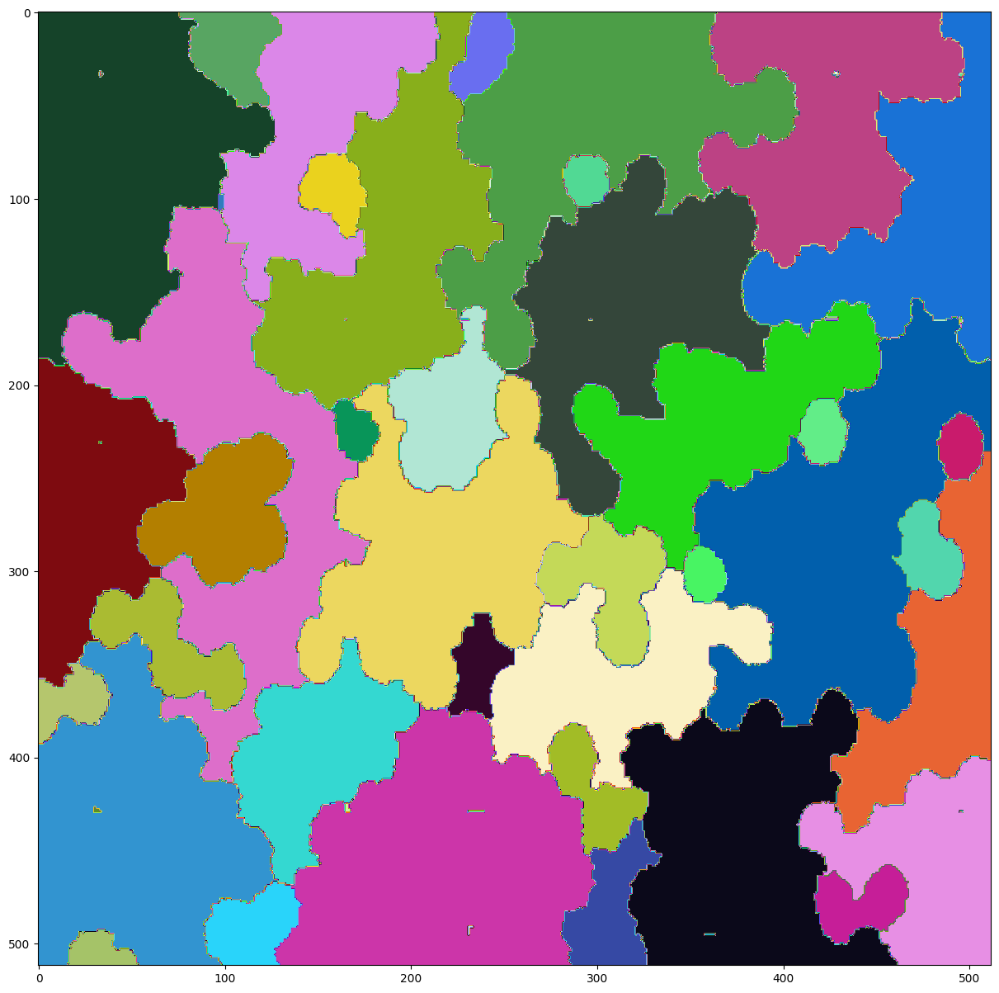

In [97]:
plt.figure(figsize =(15,15))
plt.imshow(wat,cmap =cmaprand)
plt.show()

In [104]:
imClos = morpho.closing( morpho_grad, morpho.disk(5) )
reco = morpho.reconstruction( morpho_grad, imClos)
reco = skimage.img_as_float(reco)
local_minimum = skimage.feature.peak_local_max( reco )

plt.figure( figsize=(10,10) )
plt.imshow(local_minimum, cmap='gray')
plt.show()

KeyboardInterrupt: 